In [1]:
import pyreadr
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

In [2]:
# Only Training data is used

df_FaultFree = pyreadr.read_r(r'F:\TEP_Data\The TEP Dataset\TEP_FaultFree_Training.RData')['fault_free_training']
df_Faulty = pyreadr.read_r(r'F:\TEP_Data\The TEP Dataset\TEP_Faulty_Training.RData')['faulty_training']

In [3]:
DF = pd.concat([df_FaultFree,df_Faulty]) # Join both fault free and faulty dataset
DF.head()

,faultNumber,simulationRun,sample,xmeas_1,xmeas_2,xmeas_3,xmeas_4,xmeas_5,xmeas_6,xmeas_7,...,xmv_2,xmv_3,xmv_4,xmv_5,xmv_6,xmv_7,xmv_8,xmv_9,xmv_10,xmv_11
0,0.0,1.0,1,0.25038,3674.0,4529.0,9.2320,26.889,42.402,2704.3,...,53.744,24.657,62.544,22.137,39.935,42.323,47.757,47.510,41.258,18.447
1,0.0,1.0,2,0.25109,3659.4,4556.6,9.4264,26.721,42.576,2705.0,...,53.414,24.588,59.259,22.084,40.176,38.554,43.692,47.427,41.359,17.194
2,0.0,1.0,3,0.25038,3660.3,4477.8,9.4426,26.875,42.070,2706.2,...,54.357,24.666,61.275,22.380,40.244,38.990,46.699,47.468,41.199,20.530
3,0.0,1.0,4,0.24977,3661.3,4512.1,9.4776,26.758,42.063,2707.2,...,53.946,24.725,59.856,22.277,40.257,38.072,47.541,47.658,41.643,18.089
4,0.0,1.0,5,0.29405,3679.0,4497.0,9.3381,26.889,42.650,2705.1,...,53.658,28.797,60.717,21.947,39.144,41.955,47.645,47.346,41.507,18.461


In [4]:
# Calculate summary statistics for each column
summary = DF[DF['simulationRun']==1].iloc[:,3:].describe()
print(summary)

            xmeas_1       xmeas_2       xmeas_3       xmeas_4       xmeas_5  \
count  10500.000000  10500.000000  10500.000000  10500.000000  10500.000000   
mean       0.265576   3661.241419   4505.710048      9.348456     26.904955   
std        0.143596     41.840258    103.764946      0.299329      0.235383   
min       -0.003183   3470.900000   3884.300000      7.494400     25.592000   
25%        0.225830   3636.800000   4473.000000      9.269300     26.764000   
50%        0.251195   3661.250000   4506.700000      9.352200     26.897000   
75%        0.282177   3686.500000   4545.600000      9.442225     27.056000   
max        1.005200   3820.200000   5013.300000     11.157000     28.077000   

            xmeas_6       xmeas_7       xmeas_8       xmeas_9      xmeas_10  \
count  10500.000000  10500.000000  10500.000000  10500.000000  10500.000000   
mean      42.352988   2716.501076     74.965782    120.400574      0.346336   
std        0.290591     68.489751      1.200865    

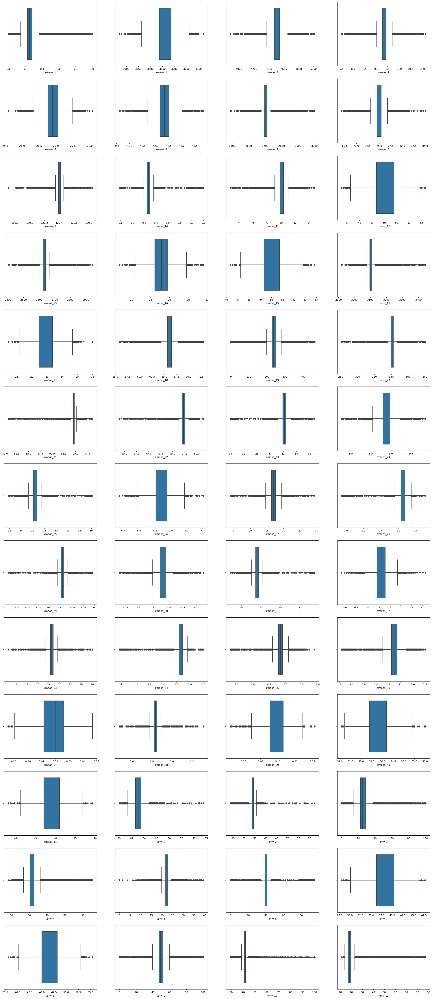

In [5]:
# Create a box plot for each variable
data = DF[DF['simulationRun']==1]
    
fig, ax = plt.subplots(13,4,figsize=(30,70))

for i,column in enumerate(data.columns[3:]):   #select all the feature columns to plot
    sns.boxplot(data=data,x=column,ax=ax.ravel()[i])

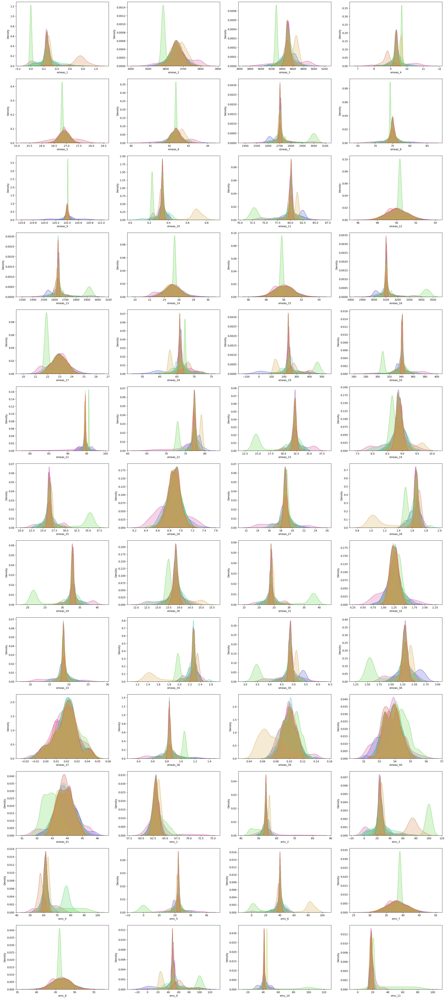

In [6]:
# KDE plot for each variable
    
fig, ax = plt.subplots(13,4,figsize=(30,70))

for i,column in enumerate(data.columns[3:]):   #select all the feature columns to plot
    sns.kdeplot(data=data, x=column, hue="faultNumber",palette="hls",ax=ax.ravel()[i],fill=True, legend=False)

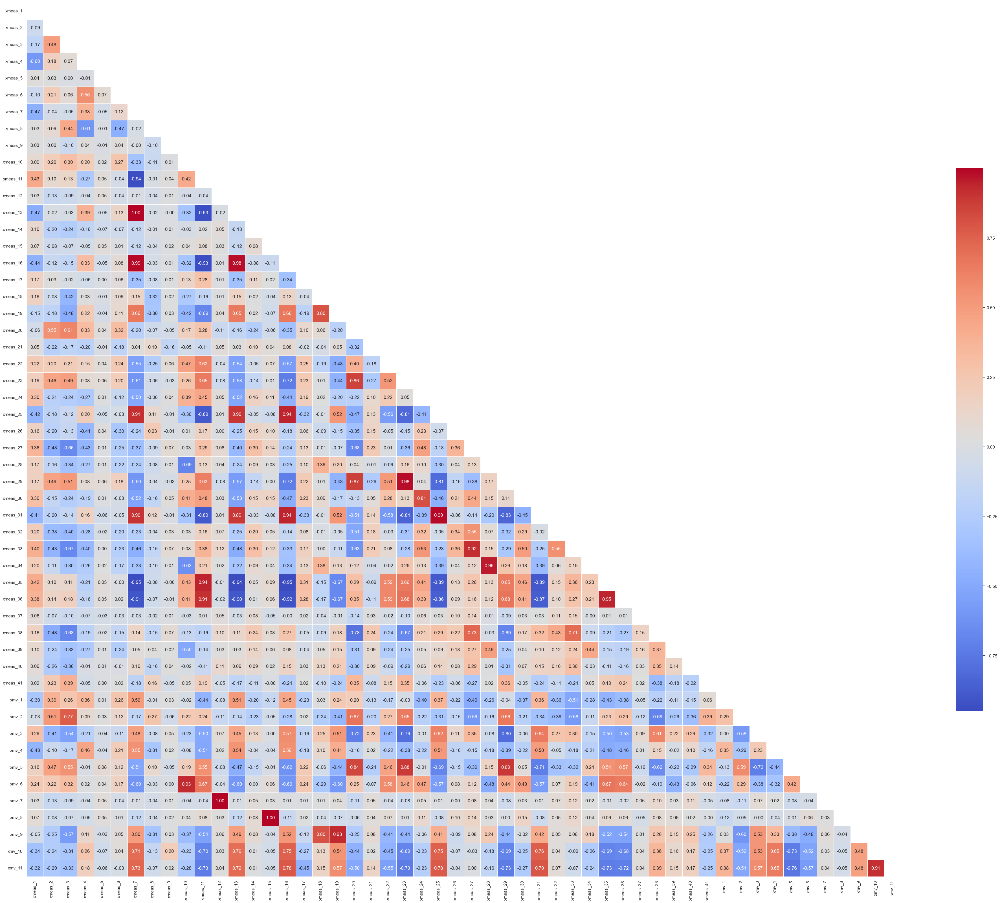

In [7]:
# Load the data into a pandas DataFrame
data = DF[DF['simulationRun']==1].iloc[:,3:]

# Calculate the correlation matrix
corr = data.corr()

# Create a heatmap with annotations
sns.set(style='white')
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(50, 50))
sns.heatmap(corr, mask=mask, cmap='coolwarm', annot=True, fmt='.2f',
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

In [8]:
# Calculate the correlation matrix
corr_matrix = data.corr()

upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape),k=1).astype(bool))

to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.90)]
print(len(to_drop)); print(to_drop)

14
['xmeas_13', 'xmeas_16', 'xmeas_25', 'xmeas_29', 'xmeas_31', 'xmeas_33', 'xmeas_34', 'xmeas_35', 'xmeas_36', 'xmv_6', 'xmv_7', 'xmv_8', 'xmv_9', 'xmv_11']


# Drop the corelated features

In [10]:
data = DF[(DF['simulationRun'] >1 ) & (DF['simulationRun'] <5 ) & (DF['sample']>20)]
reduced_data = data.drop(columns=to_drop, axis=1)
reduced_data = reduced_data[reduced_data['faultNumber'] != 3]
reduced_data = reduced_data[reduced_data['faultNumber'] != 9]
reduced_data = reduced_data[reduced_data['faultNumber'] != 15]

reduced_data

,faultNumber,simulationRun,sample,xmeas_1,xmeas_2,xmeas_3,xmeas_4,xmeas_5,xmeas_6,xmeas_7,...,xmeas_38,xmeas_39,xmeas_40,xmeas_41,xmv_1,xmv_2,xmv_3,xmv_4,xmv_5,xmv_10
520,0.0,2.0,21,0.26775,3630.7,4512.7,9.2949,26.917,42.466,2701.7,...,0.84308,0.089922,52.845,43.879,62.838,54.111,26.634,60.788,22.682,40.947
521,0.0,2.0,22,0.26725,3645.0,4459.4,9.2806,26.676,42.548,2704.6,...,0.84308,0.089922,52.845,43.879,62.592,54.749,26.683,62.394,22.758,40.933
522,0.0,2.0,23,0.25875,3712.7,4503.8,9.4355,26.791,42.003,2708.2,...,0.84308,0.089922,52.845,43.879,63.004,54.295,24.993,59.951,22.822,41.592
523,0.0,2.0,24,0.25368,3690.8,4512.4,9.3769,26.847,42.168,2709.4,...,0.84308,0.089922,52.845,43.879,63.381,54.193,25.491,62.203,22.790,41.633
524,0.0,2.0,25,0.24452,3637.5,4494.1,9.2725,26.962,42.451,2706.5,...,0.84308,0.089922,52.845,43.879,62.087,53.604,24.069,62.409,22.490,41.209
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39995,20.0,4.0,496,0.27470,3723.2,4567.9,9.3020,26.517,42.536,2721.8,...,0.81163,0.106350,53.431,43.461,63.705,54.337,26.975,62.505,21.052,42.194
39996,20.0,4.0,497,0.21871,3678.9,4571.4,9.2438,26.820,42.005,2720.3,...,0.81163,0.106350,53.431,43.461,63.124,54.213,21.423,60.565,21.235,41.728
39997,20.0,4.0,498,0.21758,3660.6,4557.0,9.3881,26.676,42.443,2716.8,...,0.81163,0.106350,53.431,43.461,63.440,54.385,21.534,60.861,20.585,41.100
39998,20.0,4.0,499,0.22549,3673.3,4547.5,9.3404,27.019,42.599,2717.9,...,0.81163,0.106350,53.431,43.461,63.126,54.451,22.272,60.715,20.895,41.116


# Scale the dataset

In [35]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler
sc = MinMaxScaler()

sc.fit(reduced_data.iloc[:,3:])


In [37]:
X = sc.transform(reduced_data.iloc[:,3:])
Y = reduced_data['faultNumber']

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
Y_enc = le.fit_transform(Y)

In [38]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, Y_enc, test_size=0.2, random_state=42)

In [39]:
y_train.shape

(20736,)

# Train the machine learning algorithms

In [40]:
# Import the required libraries
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb

# Create an instance of each algorithm
logreg = LogisticRegression(max_iter=10000)
svm = SVC()
dt = DecisionTreeClassifier()
rf = RandomForestClassifier()
nb = GaussianNB()
knn = KNeighborsClassifier()
xg = xgb.XGBClassifier()

# Train the algorithms on the data
logreg.fit(x_train, y_train)
svm.fit(x_train, y_train)
dt.fit(x_train, y_train)
rf.fit(x_train, y_train)
nb.fit(x_train, y_train)
knn.fit(x_train, y_train)
xg.fit(x_train, y_train)
 
# Use the trained models to make predictions on new data
y_pred_logreg =logreg.predict(x_test)
y_pred_svm = svm.predict(x_test)
y_pred_dt = dt.predict(x_test)
y_pred_rf = rf.predict(x_test)
y_pred_nb = nb.predict(x_test)
y_pred_knn = knn.predict(x_test)
y_pred_xg = xg.predict(x_test)

C:\Users\Asus\miniconda3\envs\tensorflow\lib\site-packages\sklearn\neighbors\_classification.py:237: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


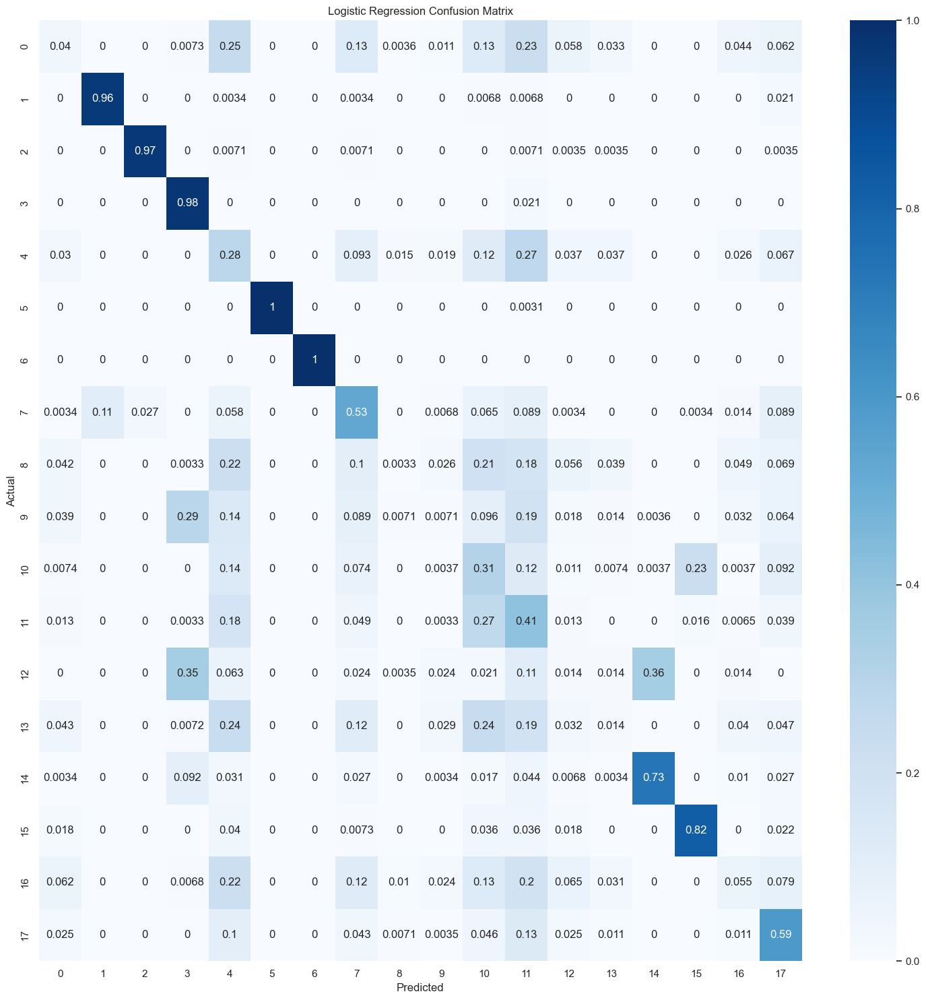

Logistic Regression accuracy_score: 0.48900462962962965


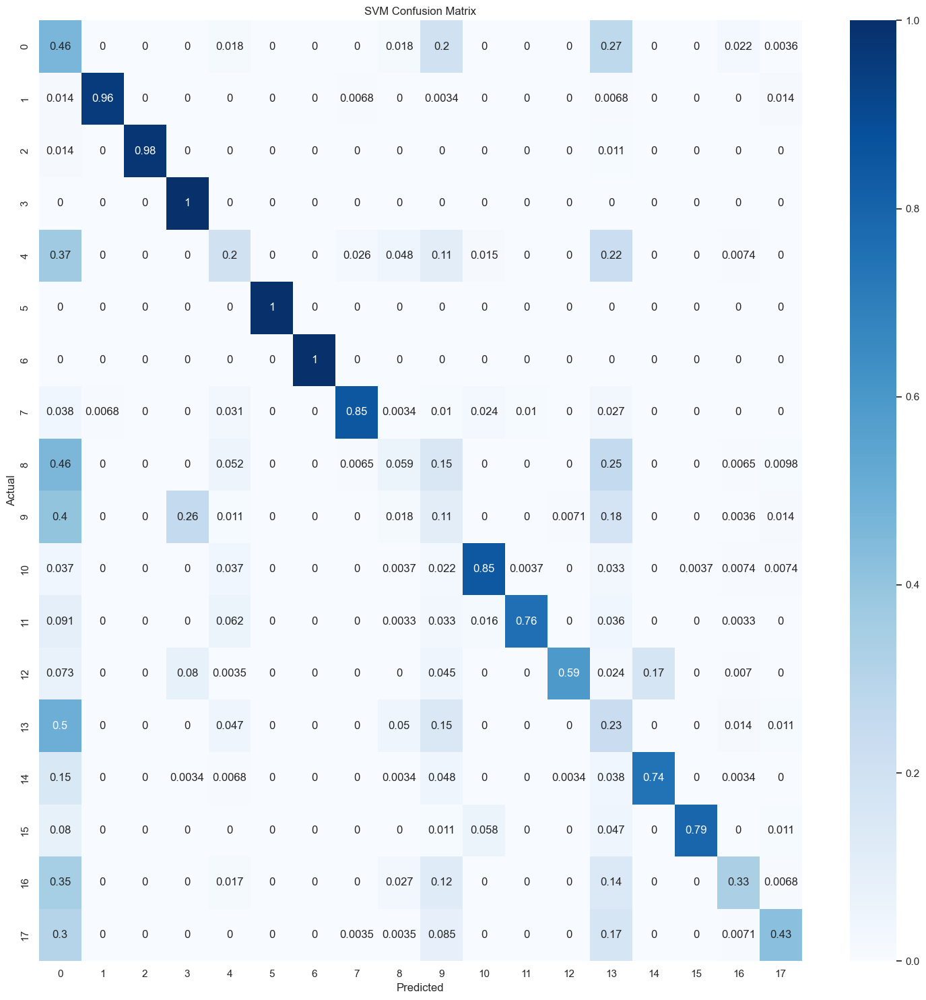

SVM accuracy_score: 0.6334876543209876


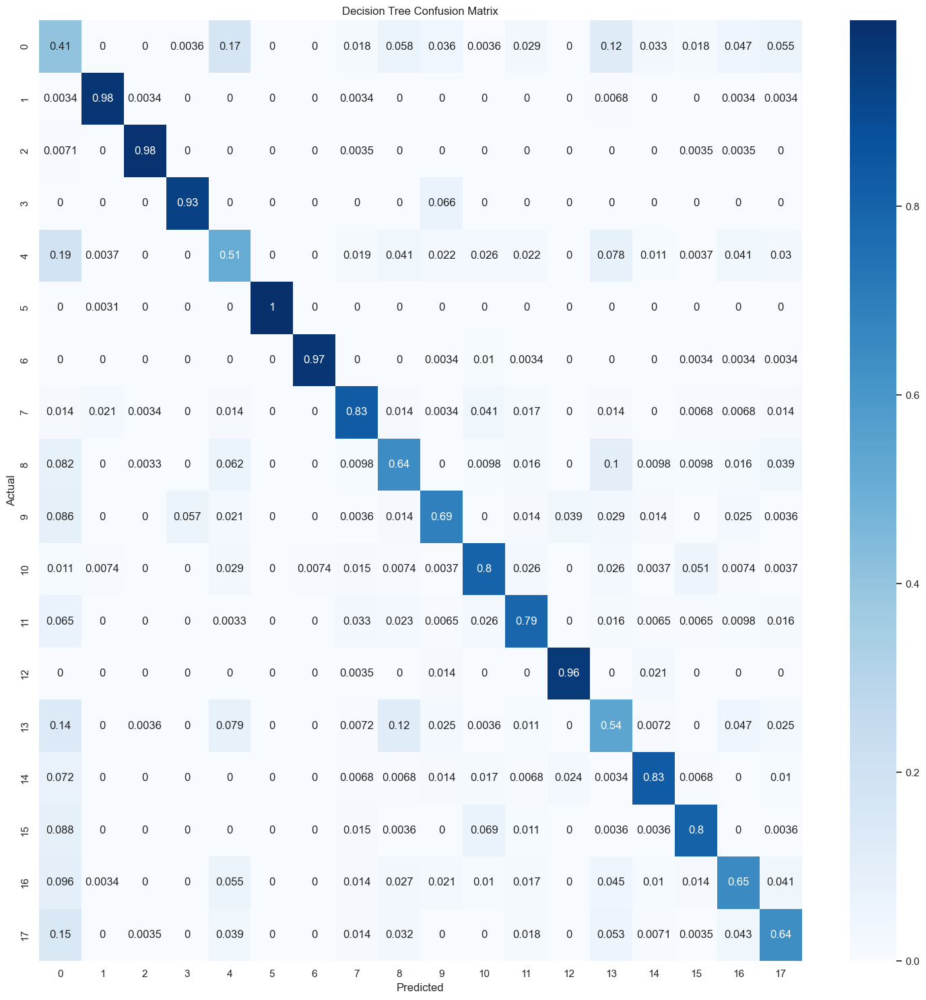

Decision Tree accuracy_score: 0.7791280864197531


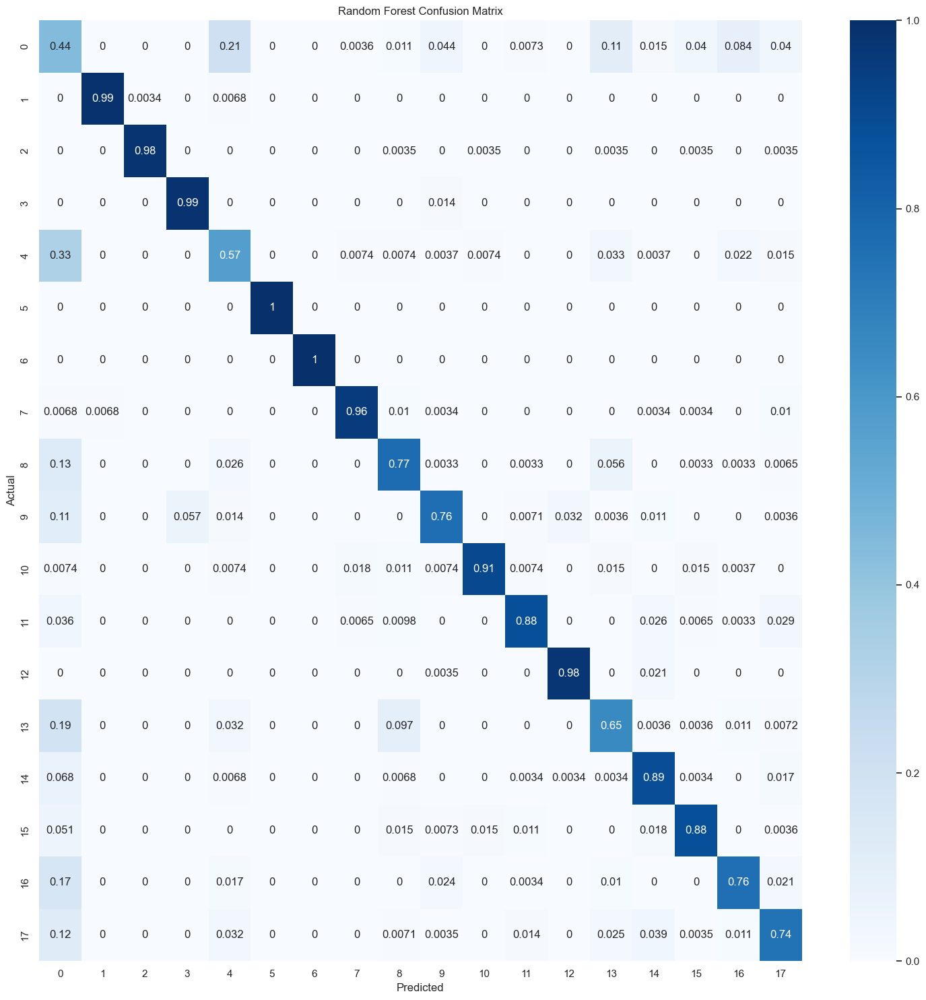

Random Forest accuracy_score: 0.8449074074074074


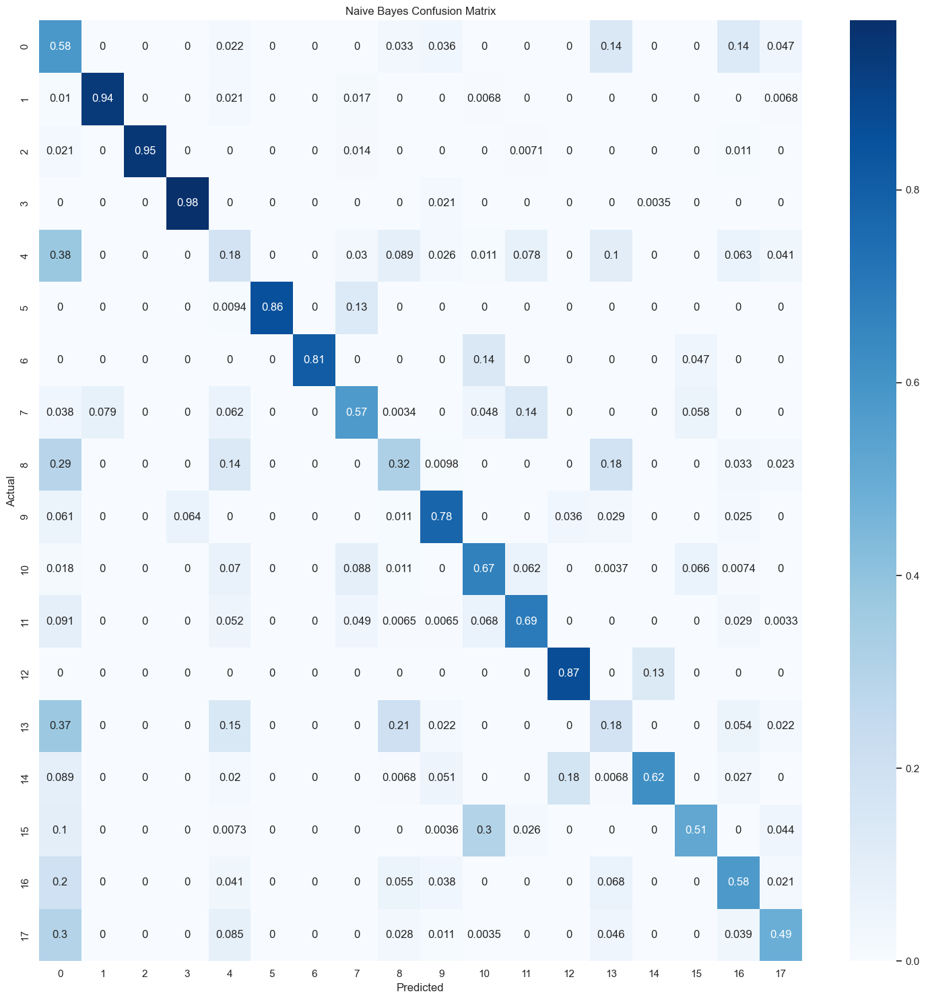

Naive Bayes accuracy_score: 0.6467978395061729


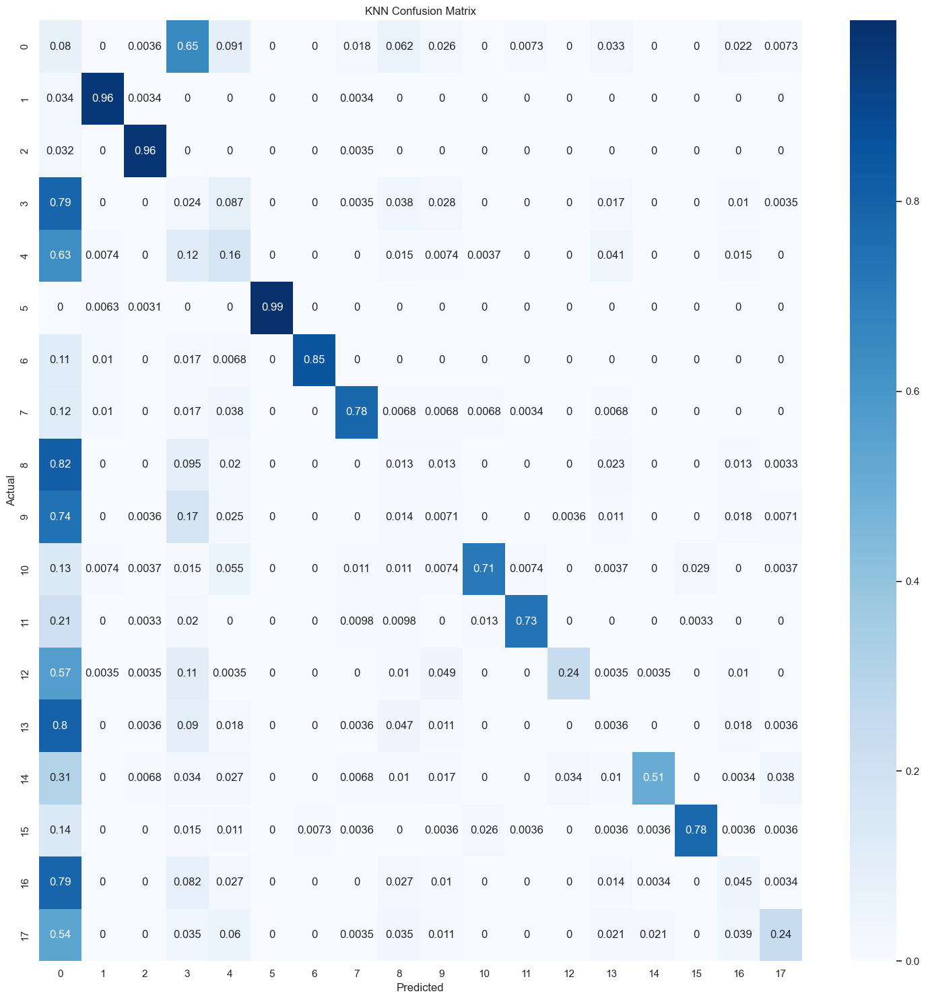

KNN accuracy_score: 0.4546682098765432


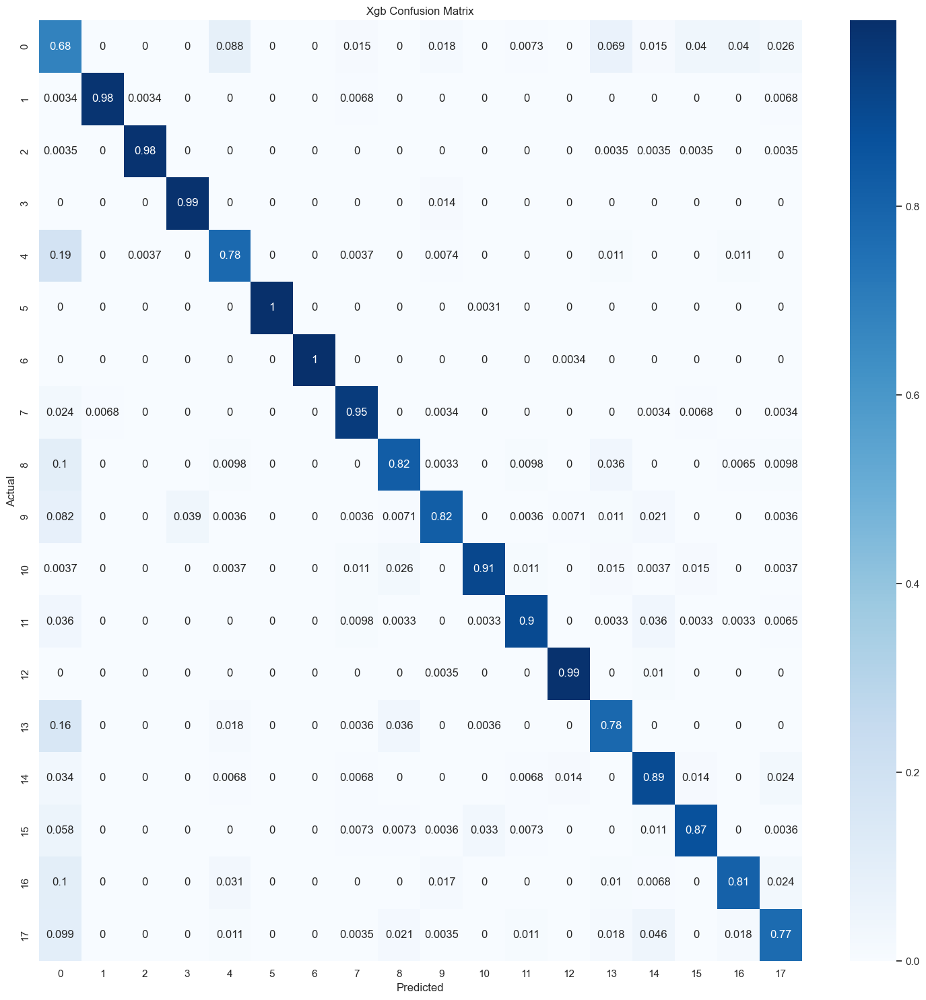

Xgb accuracy_score: 0.8856095679012346


In [41]:
# Import the required libraries
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score

# Create a function to plot the confusion matrix
def plot_confusion_matrix(y_true, y_pred, title):
    f, ax = plt.subplots(figsize=(15, 15))
    cm = confusion_matrix(y_true, y_pred,normalize='true')
    sns.heatmap(cm, annot=True, cmap='Blues',ax=ax)
    ax.set_title(title)
    ax.set_xlabel('Predicted')
    ax.set_ylabel('Actual')
    ax.set_ylim(len(cm), 0)
    plt.tight_layout()
    plt.show()

# Plot the confusion matrix and print the f1 score for each algorithm
plot_confusion_matrix(y_test, y_pred_logreg, 'Logistic Regression Confusion Matrix')
print("Logistic Regression accuracy_score:", accuracy_score(y_test, y_pred_logreg))

plot_confusion_matrix(y_test, y_pred_svm, 'SVM Confusion Matrix')
print("SVM accuracy_score:", accuracy_score(y_test, y_pred_svm))

plot_confusion_matrix(y_test, y_pred_dt, 'Decision Tree Confusion Matrix')
print("Decision Tree accuracy_score:", accuracy_score(y_test, y_pred_dt))

plot_confusion_matrix(y_test, y_pred_rf, 'Random Forest Confusion Matrix')
print("Random Forest accuracy_score:", accuracy_score(y_test, y_pred_rf))

plot_confusion_matrix(y_test, y_pred_nb, 'Naive Bayes Confusion Matrix')
print("Naive Bayes accuracy_score:", accuracy_score(y_test, y_pred_nb))

plot_confusion_matrix(y_test, y_pred_knn, 'KNN Confusion Matrix')
print("KNN accuracy_score:", accuracy_score(y_test, y_pred_knn))

plot_confusion_matrix(y_test, y_pred_xg, 'Xgb Confusion Matrix')
print("Xgb accuracy_score:", accuracy_score(y_test, y_pred_xg))

# Hyper-parameter tuning of Xg boost algorithm

In [34]:
from sklearn.model_selection import GridSearchCV, KFold

In [ ]:
# # Define the parameter grid for hyperparameter tuning
# param_grid = {
#     'max_depth': [3, 5, 7],
#     'n_estimators': [100, 200, 300]
# }

# # 'colsample_bytree': [0.6, 0.8, 1.0],
# #     'gamma': [0, 1, 5]    'learning_rate': [0.1, 0.01, 0.001],
# #     'n_estimators': [100, 200, 300],
# #     'subsample': [0.6, 0.8, 1.0]

# # Define the cross-validation strategy
# kfold = KFold(n_splits=2, shuffle=True, random_state=42)

# # Initialize the XGBoost classifier
# xgb_model = xgb.XGBClassifier()

# # Initialize the grid search object
# grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=kfold, n_jobs=-1,verbose=True)

# # Fit the grid search object to the data
# grid_result = grid_search.fit(x_train, y_train)

# # Print the best hyperparameters and their corresponding score
# print(f"Best score: {grid_result.best_score_:.4f}")
# print("Best hyperparameters:")
# for param, value in grid_result.best_params_.items():
#     print(f"{param}: {value}")

# Train using optimized model

In [19]:
xg = xgb.XGBClassifier(max_depth=5,n_estimators=200)
xg.fit(x_train, y_train)

y_pred_xg = xg.predict(x_test)

In [20]:
print("Xgb accuracy_score:", accuracy_score(y_test, y_pred_xg))

Xgb accuracy_score: 0.894483024691358


# Realtime Fault Prediction

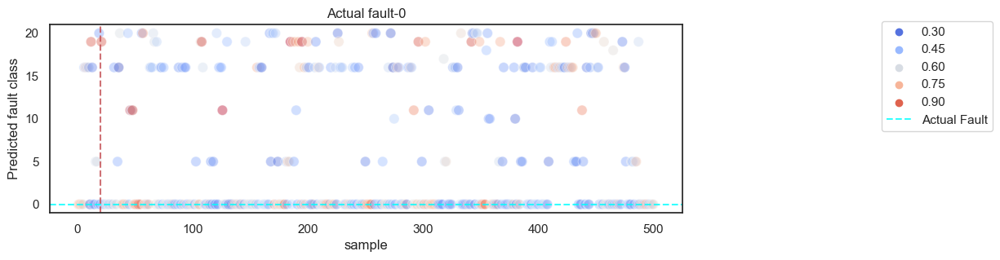

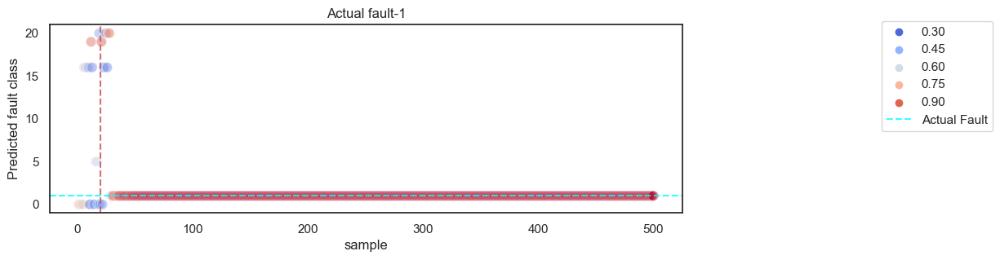

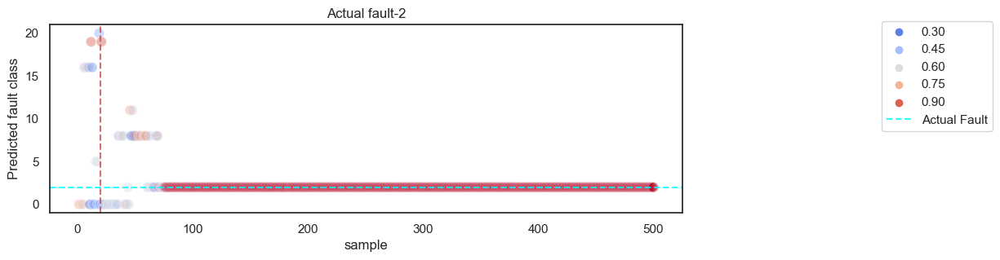

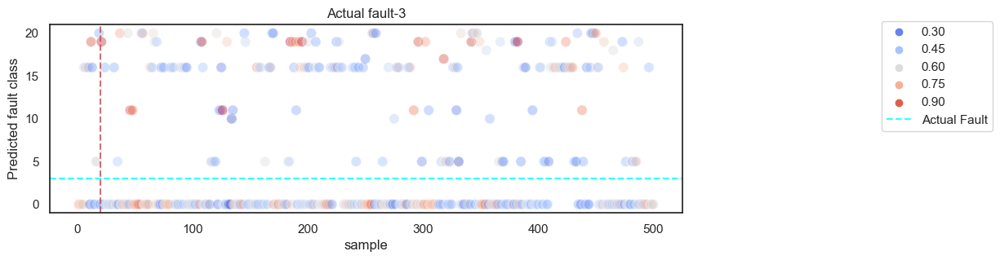

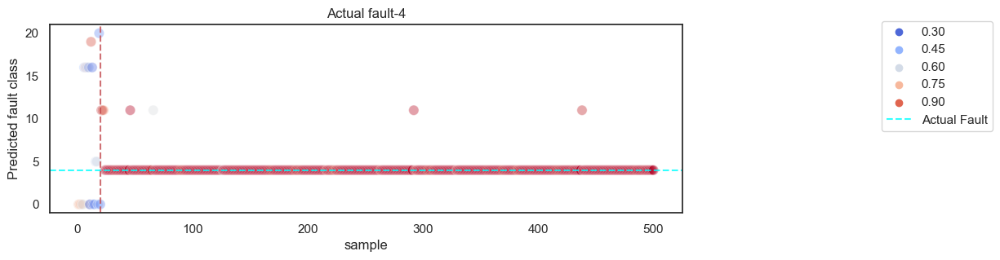

...

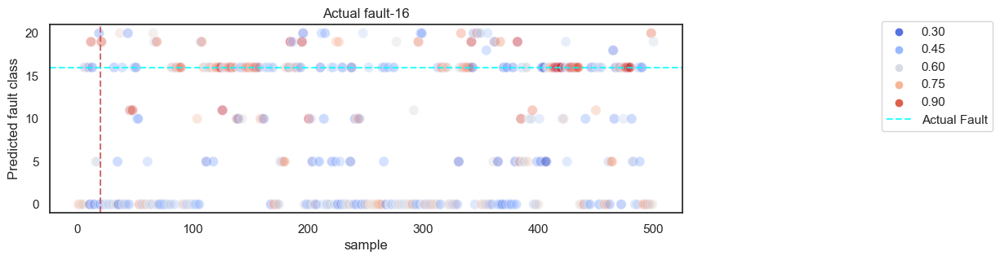

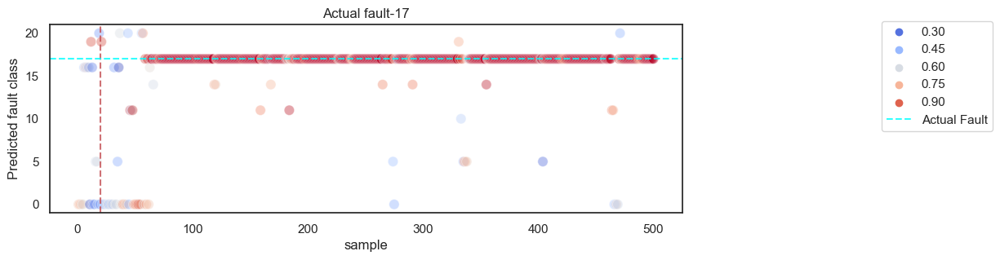

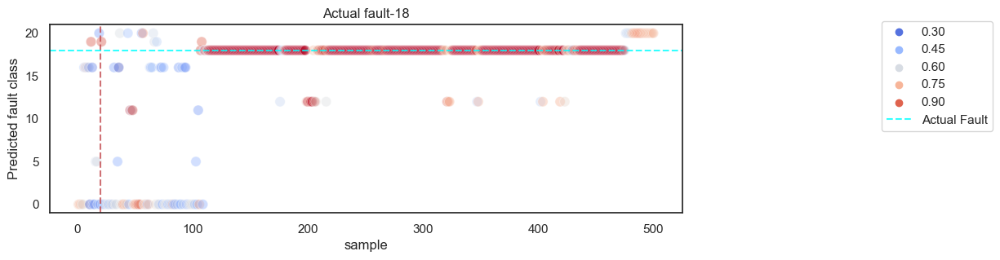

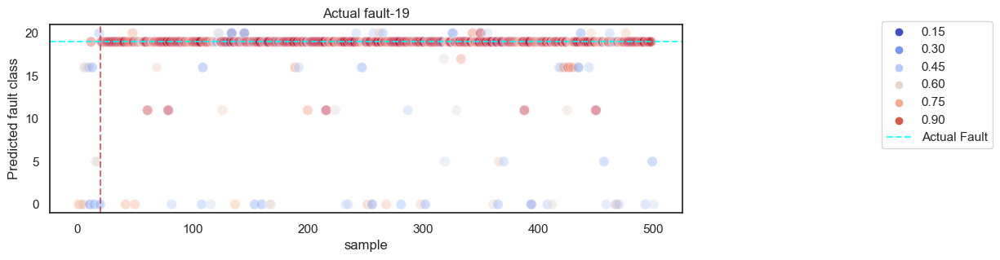

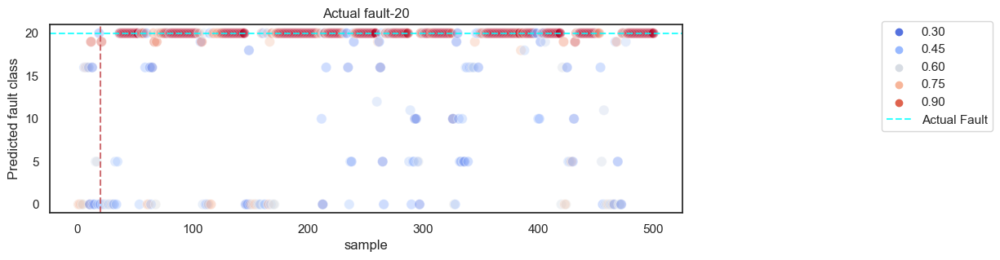

In [21]:
for F_num in range(0,21):
    df_new= DF[(DF['faultNumber']==F_num) & (DF['simulationRun']==1)].drop(columns=to_drop, axis=1)
    x_new = df_new.iloc[:,3:]
    x_new = sc.transform(x_new)

    y_pred = xg.predict(x_new)
    y_pred = le.inverse_transform(y_pred)
    y_proba = np.max(xg.predict_proba(x_new),axis=1)

    f, ax = plt.subplots(figsize=(10,3))
    sns.scatterplot(x=df_new['sample'],y=y_pred,hue=y_proba,palette="coolwarm",s=80,alpha=0.4)
    plt.axvline(20,c='r',alpha=0.8,linestyle ='--')
    plt.axhline(F_num,c='cyan',alpha=0.8,label='Actual Fault',linestyle ='--')
    plt.legend(bbox_to_anchor=(1.5, 1.05))
    plt.ylabel('Predicted fault class')
    plt.title(f'Actual fault-{F_num}')
    plt.show()


# Visualize diffrent types of faults 
### Fault no 3,9,15,19,20

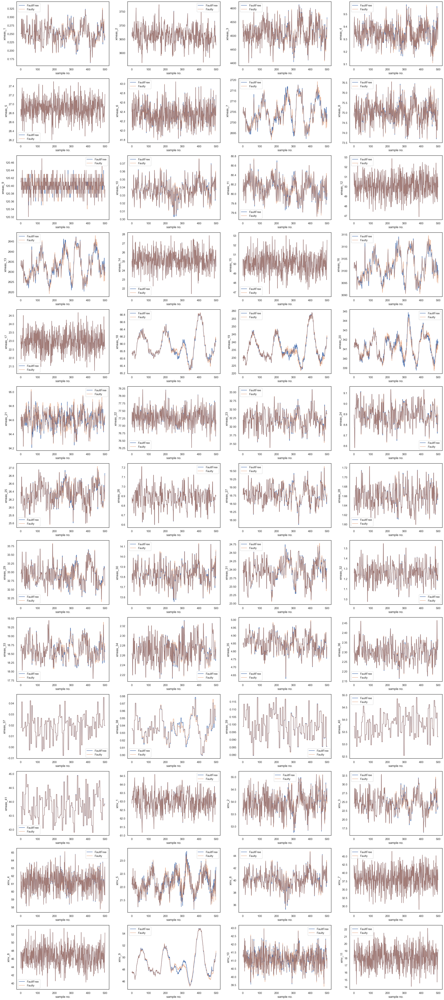

In [48]:
faultFree = DF[(DF['faultNumber']==0)&(DF['simulationRun']==1)]
faulty = DF[(DF['faultNumber']==9)&(DF['simulationRun']==1)]


fig, ax = plt.subplots(13,4,figsize=(30,70))

for i,col in enumerate(DF.iloc[:,3:]):  #select all the feature columns to plot
    ax.ravel()[i].plot(faultFree['sample'],faultFree[col],label='FaultFree')
    ax.ravel()[i].plot(faulty['sample'],faulty[col],label='Faulty',alpha=0.6)
    ax.ravel()[i].set_xlabel('sample no.')
    ax.ravel()[i].set_ylabel(col)
    ax.ravel()[i].legend()
   

# Obtain SIngle F1-score matrice

In [22]:
Acc=[]
for Fnum in [x for x in range(0,21) if x not in [3,9,15]]:

    temp_df = DF[ (DF['faultNumber']==Fnum) & (DF['sample']>20) & (DF['simulationRun']==np.random.randint(1,500))]
    X_faulty = sc.transform(temp_df.iloc[:,3:].drop(columns=to_drop, axis=1))
    y_true =temp_df['faultNumber']
    
    y_pred = xg.predict(X_faulty)
    y_pred = le.inverse_transform(y_pred)
    
    acc = accuracy_score(y_true, y_pred)
    print(f'The accuracy for Fault_num={Fnum} is {acc}')
    Acc.append(acc)
    
print('#'*20)
print(f'The overall average accuracy of XG boost is {np.mean(Acc)}')
 

The accuracy for Fault_num=0 is 0.54375
The accuracy for Fault_num=1 is 0.9916666666666667
The accuracy for Fault_num=2 is 0.98125
The accuracy for Fault_num=4 is 0.99375
The accuracy for Fault_num=5 is 0.4583333333333333
The accuracy for Fault_num=6 is 0.9979166666666667
The accuracy for Fault_num=7 is 0.9979166666666667
The accuracy for Fault_num=8 is 0.7291666666666666
The accuracy for Fault_num=10 is 0.5
The accuracy for Fault_num=11 is 0.83125
The accuracy for Fault_num=12 is 0.825
The accuracy for Fault_num=13 is 0.6875
The accuracy for Fault_num=14 is 0.9791666666666666
The accuracy for Fault_num=16 is 0.45208333333333334
The accuracy for Fault_num=17 is 0.8958333333333334
The accuracy for Fault_num=18 is 0.4875
The accuracy for Fault_num=19 is 0.8729166666666667
The accuracy for Fault_num=20 is 0.7479166666666667
####################
The overall average accuracy of XG boost is 0.7762731481481482
